In [1]:
# Importing the libraries 

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Ignore harmless warnings 

import warnings
warnings.filterwarnings("ignore")

In [2]:
# Load the abalone dataset

Abadata = pd.read_csv(r"D:\iiit notes\Internship\21 season 9th jin-2021\abalone_ord.csv", header=0)
Abadata.head()

,response,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10
0,1,0,0,1,0.075,0.055,0.01,0.0020,0.0010,0.0005,0.0015
1,1,0,0,1,0.130,0.100,0.03,0.0130,0.0045,0.0030,0.0040
2,1,0,0,1,0.110,0.090,0.03,0.0080,0.0025,0.0020,0.0030
3,1,0,0,1,0.165,0.120,0.03,0.0215,0.0070,0.0050,0.0050
4,1,1,0,0,0.210,0.150,0.05,0.0385,0.0155,0.0085,0.0100


In [3]:
# Display the information on dataset

Abadata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4177 entries, 0 to 4176
Data columns (total 11 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   response  4177 non-null   int64  
 1   V1        4177 non-null   int64  
 2   V2        4177 non-null   int64  
 3   V3        4177 non-null   int64  
 4   V4        4177 non-null   float64
 5   V5        4177 non-null   float64
 6   V6        4177 non-null   float64
 7   V7        4177 non-null   float64
 8   V8        4177 non-null   float64
 9   V9        4177 non-null   float64
 10  V10       4177 non-null   float64
dtypes: float64(7), int64(4)
memory usage: 359.1 KB


In [4]:
# Display the Descriptive Statistics

Abadata.describe()

,response,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10
count,4177.000000,4177.000000,4177.000000,4177.000000,4177.000000,4177.000000,4177.000000,4177.000000,4177.000000,4177.000000,4177.000000
mean,3.658846,0.365813,0.312904,0.321283,0.523992,0.407881,0.139516,0.828742,0.359367,0.180594,0.238831
std,1.152090,0.481715,0.463731,0.467025,0.120093,0.099240,0.041827,0.490389,0.221963,0.109614,0.139203
min,1.000000,0.000000,0.000000,0.000000,0.075000,0.055000,0.000000,0.002000,0.001000,0.000500,0.001500
25%,3.000000,0.000000,0.000000,0.000000,0.450000,0.350000,0.115000,0.441500,0.186000,0.093500,0.130000
50%,3.000000,0.000000,0.000000,0.000000,0.545000,0.425000,0.140000,0.799500,0.336000,0.171000,0.234000
75%,4.000000,1.000000,1.000000,1.000000,0.615000,0.480000,0.165000,1.153000,0.502000,0.253000,0.329000
max,10.000000,1.000000,1.000000,1.000000,0.815000,0.650000,1.130000,2.825500,1.488000,0.760000,1.005000


In [5]:
# Identify the dependent and Target variables

IndepVar = []
for col in Abadata.columns:
    if col != 'response':
        IndepVar.append(col)

TargetVar = 'response'
x = Abadata[IndepVar]
y = Abadata[TargetVar]


In [6]:
# Merge two Dataframes on index of both the dataframes (to plot the decision tree graphs)

Abadata = x.merge(y, left_index=True, right_index=True)
Abadata.head()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,response
0,0,0,1,0.075,0.055,0.01,0.0020,0.0010,0.0005,0.0015,1
1,0,0,1,0.130,0.100,0.03,0.0130,0.0045,0.0030,0.0040,1
2,0,0,1,0.110,0.090,0.03,0.0080,0.0025,0.0020,0.0030,1
3,0,0,1,0.165,0.120,0.03,0.0215,0.0070,0.0050,0.0050,1
4,1,0,0,0.210,0.150,0.05,0.0385,0.0155,0.0085,0.0100,1


In [7]:
# Splitting the dataset into train and test 

from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.30, random_state =42)

In [8]:
# Splitting the dataset into train and test 

from sklearn.model_selection import train_test_split
x1_train, x1_test, y1_train, y1_test = train_test_split(x, y, test_size = 0.30, stratify = y, random_state =42)

In [9]:
# Build Random Forest classification model and Train the model by using the training datase

from sklearn.ensemble import RandomForestClassifier

AbadataRF = RandomForestClassifier(n_estimators=500, criterion='gini', max_depth=None, min_samples_split=2, 
                                   min_samples_leaf=1, min_weight_fraction_leaf=0.0, max_features='auto', 
                                   max_leaf_nodes=None, min_impurity_decrease=0.0, min_impurity_split=None, 
                                   bootstrap=True, oob_score=False, n_jobs=None, random_state=None, verbose=0, 
                                   warm_start=False, class_weight=None, ccp_alpha=0.0, max_samples=None)

AbadataRF = AbadataRF.fit(x_train, y_train)

In [10]:
# To display the algorithm paramaters

params1 = AbadataRF.get_params()
print(params1)

{'bootstrap': True, 'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'gini', 'max_depth': None, 'max_features': 'auto', 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_impurity_split': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 500, 'n_jobs': None, 'oob_score': False, 'random_state': None, 'verbose': 0, 'warm_start': False}


In [11]:
# Predict the model with test data set

y_pred = AbadataRF.predict(x_test)

In [12]:
# confusion matrix in sklearn

from sklearn.metrics import multilabel_confusion_matrix
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from math import sqrt

print(confusion_matrix(y_pred, y_test)) # Vertical is actual values & horizontal is predicted values

# Actual and predicted classes

lst_actual_class = y_test
lst_predicted_class = y_pred

# Class = Label 0-10

lst_classes = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]

# Compute multi-class confusion matrix

arr_out_matrix = multilabel_confusion_matrix(lst_actual_class, lst_predicted_class, labels=lst_classes)

# Temp store results

model_acc = [];
model_recall = [];
model_prec = [];
model_fscore = [];
model_spec = [];
model_bal_acc = [];
model_mcc = [];
for no_class in range(len(lst_classes)):
    arr_data = arr_out_matrix[no_class];
    print("Print Class: {0}".format(no_class));

    tp = arr_data[1][1]
    fp = arr_data[0][1]
    tn = arr_data[0][0]
    fn = arr_data[1][0]

    sensitivity = round(tp/(tp+fn), 3);
    specificity = round(tn/(tn+fp), 3);
    accuracy = round((tp+tn)/(tp+fp+tn+fn), 3);
    balanced_accuracy = round((sensitivity+specificity)/2, 3);

    precision = round(tp/(tp+fp), 3);
    f1Score = round((2*tp/(2*tp + fp + fn)), 3);

    m = (tp+fp) * (tp+fn) * (tn+fp) * (tn+fn)
    MCC = round(((tp * tn) - (fp * fn)) / sqrt(m), 3)
    model_acc.append(accuracy);
    model_prec.append(precision);
    model_recall.append(sensitivity);
    model_fscore.append(f1Score);
    model_spec.append(specificity);
    model_bal_acc.append(balanced_accuracy);
    model_mcc.append(MCC);

    print("TP={0}, FP={1}, TN={2}, FN={3}".format(tp, fp, tn, fn));
    print("Accuracy: {0}".format(accuracy)); # Accuracy score
    print("Precision: {0}".format(precision)); # Precision score
    print("Sensitivity: {0}".format(sensitivity)); # Recall score
    print("F1-Score: {0}".format(f1Score)); # F1 score
    print("Specificity: {0}".format(specificity)); # True Nagative Rate
    print("Balanced Accuracy: {0}".format(balanced_accuracy)); # Balance accuracy score
    print("MCC: {0}\n".format(MCC)); # Matthews Correlation Coefficient

[[  3   7   0   0   0   0   0   0   0]
 [  3  78  22   1   0   0   0   0   0]
 [  0  61 344 119  23   3   3   0   0]
 [  0   2 119 257  86  20  10   7   1]
 [  0   0   3  25  19   9  10   2   1]
 [  0   0   1   2   4   2   2   0   0]
 [  0   0   0   1   2   1   0   0   0]
 [  0   0   0   1   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0   0]]
Print Class: 0
TP=3, FP=7, TN=1241, FN=3
Accuracy: 0.992
Precision: 0.3
Sensitivity: 0.5
F1-Score: 0.375
Specificity: 0.994
Balanced Accuracy: 0.747
MCC: 0.384

Print Class: 1
TP=78, FP=26, TN=1080, FN=70
Accuracy: 0.923
Precision: 0.75
Sensitivity: 0.527
F1-Score: 0.619
Specificity: 0.976
Balanced Accuracy: 0.752
MCC: 0.589

Print Class: 2
TP=344, FP=209, TN=556, FN=145
Accuracy: 0.718
Precision: 0.622
Sensitivity: 0.703
F1-Score: 0.66
Specificity: 0.727
Balanced Accuracy: 0.715
MCC: 0.423

Print Class: 3
TP=257, FP=245, TN=603, FN=149
Accuracy: 0.686
Precision: 0.512
Sensitivity: 0.633
F1-Score: 0.566
Specificity: 0.711
Balanced Accuracy:

In [13]:
# OVERALL - FINAL PREDICTION PERFORMANCE

# importing mean()

from statistics import mean
import math

print("Overall Performance Prediction:");
print("Accuracy: {0}%".format(round(mean(model_acc)*100, 4)));
print("Precision: {0}%".format(round(mean(model_prec)*100, 4)));
print("Recall or Sensitivity: {0}%".format(round(mean(model_recall)*100, 4)));
print("F1-Score: {0}".format(round(mean(model_fscore), 4)));
print("Specificity or True Nagative Rate: {0}%".format(round(mean(model_spec)*100, 4)));
print("Balanced Accuracy: {0}%\n".format(round(mean(model_bal_acc)*100, 4)));
print("MCC: {0}\n".format(round(mean(model_mcc), 4)));

Overall Performance Prediction:
Accuracy: 91.21%
Precision: nan%
Recall or Sensitivity: nan%
F1-Score: nan
Specificity or True Nagative Rate: 93.52%
Balanced Accuracy: nan%

MCC: nan



# Random Forest with Stratified Sampling

In [14]:
# Build Random Forest classification model and Train the model using the training sets with Stratified sampling

from sklearn.ensemble import RandomForestClassifier 

AbadataRF1 = RandomForestClassifier(n_estimators=100, criterion='gini', max_depth=None, min_samples_split=2, 
                                    min_samples_leaf=1, min_weight_fraction_leaf=0.0, max_features='auto', 
                                    max_leaf_nodes=None, min_impurity_decrease=0.0, min_impurity_split=None, 
                                    bootstrap=True, oob_score=False, n_jobs=None, random_state=None, verbose=0, 
                                    warm_start=False, class_weight=None, ccp_alpha=0.0, max_samples=None)

AbadataRF1 = AbadataRF1.fit(x1_train, y1_train)

# Predict the model with test data set

y1_pred = AbadataRF1.predict(x1_test)

# confusion matrix in sklearn

from sklearn.metrics import multilabel_confusion_matrix
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from math import sqrt

print(confusion_matrix(y1_pred, y1_test)) # Vertical is actual values & horizontal is predicted values

# Actual and predicted classes

lst_actual_class = y1_test
lst_predicted_class = y1_pred

# Class = Label 0-10

lst_classes = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]

# Compute multi-class confusion matrix

arr_out_matrix = multilabel_confusion_matrix(lst_actual_class, lst_predicted_class, labels=lst_classes)

# Temp store results

model_acc = [];
model_recall = [];
model_prec = [];
model_fscore = [];
model_spec = [];
model_bal_acc = [];
model_mcc = [];
for no_class in range(len(lst_classes)):
    arr_data = arr_out_matrix[no_class];
    print("Print Class: {0}".format(no_class));

    tp = arr_data[1][1]
    fp = arr_data[0][1]
    tn = arr_data[0][0]
    fn = arr_data[1][0]

    sensitivity = round(tp/(tp+fn), 3);
    specificity = round(tn/(tn+fp), 3);
    accuracy = round((tp+tn)/(tp+fp+tn+fn), 3);
    balanced_accuracy = round((sensitivity+specificity)/2, 3);

    precision = round(tp/(tp+fp), 3);
    f1Score = round((2*tp/(2*tp + fp + fn)), 3);

    m = (tp+fp) * (tp+fn) * (tn+fp) * (tn+fn)
    MCC = round(((tp * tn) - (fp * fn)) / sqrt(m), 3)
    model_acc.append(accuracy);
    model_prec.append(precision);
    model_recall.append(sensitivity);
    model_fscore.append(f1Score);
    model_spec.append(specificity);
    model_bal_acc.append(balanced_accuracy);
    model_mcc.append(MCC);

    print("TP={0}, FP={1}, TN={2}, FN={3}".format(tp, fp, tn, fn));
    print("Accuracy: {0}".format(accuracy)); # Accuracy score
    print("Precision: {0}".format(precision)); # Precision score
    print("Sensitivity: {0}".format(sensitivity)); # Recall score
    print("F1-Score: {0}".format(f1Score)); # F1 score
    print("Specificity: {0}".format(specificity)); # True Nagative Rate
    print("Balanced Accuracy: {0}".format(balanced_accuracy)); # Balance accuracy score
    print("MCC: {0}\n".format(MCC)); # Matthews Correlation Coefficient

# Area under ROC curve 
# print('roc_auc_score:', round(roc_auc_score(y_test, y_pred, multi_class="ovr",average='we
# AUC-ROC curve is only for binary classification problems. we can extend it to multiclass 
# by using the One vs All technique (OneVsRestClassifier)

[[  0   0   0   0   0   0   0   0   0   0]
 [  5  70  37   4   0   0   0   0   0   0]
 [  0  57 337 132  26   5   3   1   0   0]
 [  0   1 116 250  77  15  17   5   0   0]
 [  0   1   5  29  21  11   9   3   1   1]
 [  0   0   0   2   4   5   1   0   0   0]
 [  0   0   0   0   1   0   0   0   0   0]
 [  0   0   0   0   1   1   0   0   0   0]
 [  0   0   0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0   0   0]]
Print Class: 0
TP=0, FP=0, TN=1249, FN=5
Accuracy: 0.996
Precision: nan
Sensitivity: 0.0
F1-Score: 0.0
Specificity: 1.0
Balanced Accuracy: 0.5
MCC: nan

Print Class: 1
TP=70, FP=46, TN=1079, FN=59
Accuracy: 0.916
Precision: 0.603
Sensitivity: 0.543
F1-Score: 0.571
Specificity: 0.959
Balanced Accuracy: 0.751
MCC: 0.526

Print Class: 2
TP=337, FP=224, TN=535, FN=158
Accuracy: 0.695
Precision: 0.601
Sensitivity: 0.681
F1-Score: 0.638
Specificity: 0.705
Balanced Accuracy: 0.693
MCC: 0.379

Print Class: 3
TP=250, FP=231, TN=606, FN=167
Accuracy: 0.683
Precision: 0.52


In [15]:
# OVERALL - FINAL PREDICTION PERFORMANCE

# importing mean()

from statistics import mean
import math

print("Overall Performance Prediction:");
print("Accuracy: {0}%".format(round(mean(model_acc)*100, 4)));
print("Precision: {0}%".format(round(mean(model_prec)*100, 4)));
print("Recall or Sensitivity: {0}%".format(round(mean(model_recall)*100, 4)));
print("F1-Score: {0}".format(round(mean(model_fscore), 4)));
print("Specificity or True Nagative Rate: {0}%".format(round(mean(model_spec)*100, 4)));
print("Balanced Accuracy: {0}%\n".format(round(mean(model_bal_acc)*100, 4)));
print("MCC: {0}\n".format(round(mean(model_mcc), 4)));

Overall Performance Prediction:
Accuracy: 90.88%
Precision: nan%
Recall or Sensitivity: 21.21%
F1-Score: 0.2169
Specificity or True Nagative Rate: 93.26%
Balanced Accuracy: 57.23%

MCC: nan



In [16]:
# Check Important features

feature_importances_Abadata = pd.DataFrame(
     {"feature": list(x.columns), "importance": AbadataRF.feature_importances_}
     ).sort_values("importance", ascending=False)

# Display the features importance

print(feature_importances_Abadata)

  feature  importance
9     V10    0.192469
7      V8    0.150814
6      V7    0.147476
8      V9    0.143884
4      V5    0.108764
5      V6    0.105534
3      V4    0.103237
2      V3    0.017952
1      V2    0.014947
0      V1    0.014923


Feature: 0, Score: 0.01492
Feature: 1, Score: 0.01495
Feature: 2, Score: 0.01795
Feature: 3, Score: 0.10324
Feature: 4, Score: 0.10876
Feature: 5, Score: 0.10553
Feature: 6, Score: 0.14748
Feature: 7, Score: 0.15081
Feature: 8, Score: 0.14388
Feature: 9, Score: 0.19247


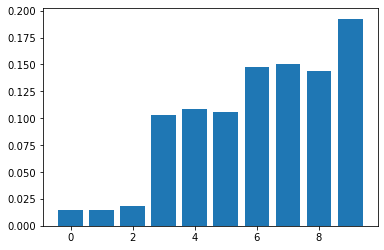

In [17]:
# Get feature (independent variables) importance

from matplotlib import pyplot
importance = AbadataRF.feature_importances_

# Summarize feature importance

for i,j in enumerate(importance):
 print('Feature: %0d, Score: %.5f' % (i,j))
 
# Plot feature importance

pyplot.bar([x for x in range(len(importance))], importance)
pyplot.show()


In [18]:
# Display the Actual vs Predicted

CompResults = pd.DataFrame({'Response':y_test, 'Response_Pred':y_pred})
CompResults.head()

,Response,Response_Pred
866,3,3
1483,3,3
599,3,3
1702,3,3
670,3,4


In [19]:
# Merge two Dataframes on index of both the dataframes

x_test = pd.DataFrame(x_test)
TestResults = x_test.merge(CompResults, left_index=True, right_index=True)
TestResults.head()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,Response,Response_Pred
866,0,0,1,0.395,0.305,0.105,0.2840,0.1135,0.0595,0.0945,3,3
1483,1,0,0,0.590,0.460,0.140,1.0040,0.4960,0.2165,0.2600,3,3
599,1,0,0,0.360,0.295,0.100,0.2105,0.0660,0.0525,0.0750,3,3
1702,1,0,0,0.510,0.415,0.145,0.7510,0.3295,0.1835,0.2030,3,3
670,1,0,0,0.655,0.520,0.165,1.4095,0.5860,0.2910,0.4050,3,4


In [20]:
Abadata.columns

Index(['V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10',
       'response'],
      dtype='object')

In [21]:
cols = ['V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10']

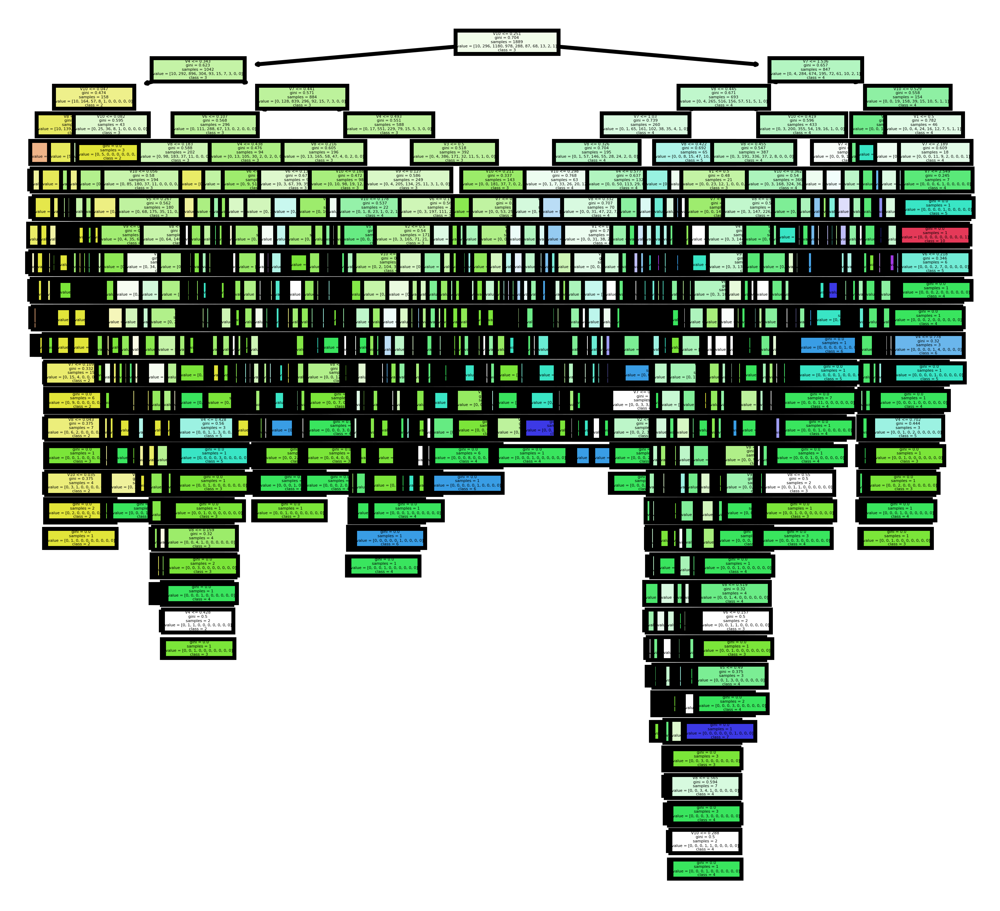

In [22]:
# Visualize individual trees and code below visualizes the first decision tree of Random Forest

from sklearn import tree
fn1=cols
cn1=['1', '2', '3', '4', '5', '6', '7', '8', '9', '10']
fig, axes = plt.subplots(nrows = 1, ncols = 1, figsize = (4,4), dpi=800)
tree.plot_tree(AbadataRF.estimators_[0],
 feature_names = fn1, 
 class_names=cn1,
 filled = True);
fig.savefig('AbadataRF.png')

In [23]:
# Visualize individual trees and code below visualizes the first 5 decision trees of Random
from sklearn import tree
fn2=cols
cn2=['1', '2', '3', '4', '5', '6', '7', '8', '9', '10']
fig, axes = plt.subplots(nrows = 1, ncols = 5, figsize = (10,2), dpi=3000)
for index in range(0, 5):
    tree.plot_tree(AbadataRF.estimators_[index],
     feature_names = fn2, 
     class_names=cn2,
    filled = True,
     ax = axes[index]);
 
    axes[index].set_title('Estimator: ' + str(index), fontsize = 11)
fig.savefig('diadataRF1.png')

In [24]:
# Initialize an array that stores the Accuracy with Random Forest algorithm 
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
accuracy1 = []
for a in range(100, 1100, 100):
    AbadataRF1 = RandomForestClassifier(n_estimators=a,criterion='gini', max_depth=None, min_samples_split=2, 
                                    min_samples_leaf=1, min_weight_fraction_leaf=0.0, max_features='auto', 
                                    max_leaf_nodes=None, min_impurity_decrease=0.0, min_impurity_split=None, 
                                    bootstrap=True, oob_score=False, n_jobs=None, random_state=None, verbose=0, 
                                    warm_start=False, class_weight=None, ccp_alpha=0.0, max_samples=None)
    AbadataRF1.fit(x_train, y_train)
    
    # Predict the model with test data set
    y2_pred = AbadataRF1.predict(x_test)
    print('RF Tree = ', a)

    # Confusion matrix

    from sklearn.metrics import confusion_matrix
    from sklearn.metrics import classification_report

    # actual values

    actual = y_test

    # predicted values

    predicted = y2_pred

    # confusion matrix

    matrix = confusion_matrix(actual, predicted, labels=[1, 0], sample_weight=None, normalize=None)
    print('Confusion matrix: \n', matrix)

    # outcome values order in sklearn

    tp, fn, fp, tn = confusion_matrix(actual, predicted, labels=[1, 0], sample_weight=None, normalize=None).reshape(-1)

    print('Outcome Values : \n', tp, fn, fp, tn)

    # Classification report for precision, rrecall f1-Score and accuracy

    matrix = classification_report(actual, predicted, labels=[1,0])
    print('Classification report : \n', matrix)

    # Calculating the metrics

    sensitivity = round(tp/(tp+fn), 3)

    specificity = round(tn/(tn+fp), 3)

    accuracy = round((tp+tn)/(tp+fp+fn+tn), 3)
    balanced_accuracy = round((sensitivity+specificity)/2, 3)
    precision = round(tp/(tp+fp), 3)
    f1Score = round((2*tp/(2*tp+fp+fn)), 3)

    # Mathews Correlation coefficient (MCC). Range of values of MCC lie between -1 to +1
    # A Model with a score of +1 is perfect model and -1 is a poor model

    from math import sqrt

    m = (tp+fp)*(tp+fn)*(tn+fp)*(tn+fn)

    MCC = round(((tp* tn) - (fp * fn)) / sqrt(m), 3)

    print('Accuracy :', round(accuracy*100, 2), '%')
    print('Precision :', round(precision*100, 2), '%')
    print('Recall :', round(sensitivity*100, 2), '%')
    print('F1 Score :', f1Score)
    print('Balanced Accuracy :', round(balanced_accuracy*100, 2), '%')
    print('MCC', MCC)

RF Tree =  100
Confusion matrix: 
 [[4 0]
 [0 0]]
Outcome Values : 
 4 0 0 0
Classification report : 
               precision    recall  f1-score   support

           1       0.33      0.67      0.44         6
           0       0.00      0.00      0.00         0

   micro avg       0.33      0.67      0.44         6
   macro avg       0.17      0.33      0.22         6
weighted avg       0.33      0.67      0.44         6

Accuracy : 100.0 %
Precision : 100.0 %
Recall : 100.0 %
F1 Score : 1.0
Balanced Accuracy : nan %
MCC nan
RF Tree =  200
Confusion matrix: 
 [[3 0]
 [0 0]]
Outcome Values : 
 3 0 0 0
Classification report : 
               precision    recall  f1-score   support

           1       0.27      0.50      0.35         6
           0       0.00      0.00      0.00         0

   micro avg       0.27      0.50      0.35         6
   macro avg       0.14      0.25      0.18         6
weighted avg       0.27      0.50      0.35         6

Accuracy : 100.0 %
Precision : 100.

In [25]:
# OVERALL - FINAL PREDICTION PERFORMANCE

# importing mean()

from statistics import mean
import math

print("Overall Performance Prediction:");
print("Accuracy: {0}%".format(round(mean(model_acc)*100, 4)));
print("Precision: {0}%".format(round(mean(model_prec)*100, 4)));
print("Recall or Sensitivity: {0}%".format(round(mean(model_recall)*100, 4)));
print("F1-Score: {0}".format(round(mean(model_fscore), 4)));
print("Specificity or True Nagative Rate: {0}%".format(round(mean(model_spec)*100, 4)));
print("Balanced Accuracy: {0}%\n".format(round(mean(model_bal_acc)*100, 4)));
print("MCC: {0}\n".format(round(mean(model_mcc), 4)));

Overall Performance Prediction:
Accuracy: 90.88%
Precision: nan%
Recall or Sensitivity: 21.21%
F1-Score: 0.2169
Specificity or True Nagative Rate: 93.26%
Balanced Accuracy: 57.23%

MCC: nan



# Decision Tree

In [26]:
# To build the decision tree model and tain the model with training dataset with random sampling

from sklearn.tree import DecisionTreeClassifier

AbadataDT = DecisionTreeClassifier()

AbadataDT = AbadataDT.fit(x_train,y_train)

# Predict the model with test data set
y3_pred = AbadataDT.predict(x_test)

# Confusion matrix

from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

# actual values

actual = y_test

# predicted values

predicted = y3_pred

# confusion matrix

matrix = confusion_matrix(actual, predicted, labels=[1, 0], sample_weight=None, normalize=None)
print('Confusion matrix: \n', matrix)

# outcome values order in sklearn

tp, fn, fp, tn = confusion_matrix(actual, predicted, labels=[1, 0], sample_weight=None, normalize=None).reshape(-1)

print('Outcome Values : \n', tp, fn, fp, tn)

# Classification report for precision, rrecall f1-Score and accuracy

matrix = classification_report(actual, predicted, labels=[1,0])
print('Classification report : \n', matrix)

# Calculating the metrics

sensitivity = round(tp/(tp+fn), 3)

specificity = round(tn/(tn+fp), 3)

accuracy = round((tp+tn)/(tp+fp+fn+tn), 3)
balanced_accuracy = round((sensitivity+specificity)/2, 3)
precision = round(tp/(tp+fp), 3)
f1Score = round((2*tp/(2*tp+fp+fn)), 3)

# Mathews Correlation coefficient (MCC). Range of values of MCC lie between -1 to +1
# A Model with a score of +1 is perfect model and -1 is a poor model

from math import sqrt

m = (tp+fp)*(tp+fn)*(tn+fp)*(tn+fn)

MCC = round(((tp* tn) - (fp * fn)) / sqrt(m), 3)

print('Accuracy :', round(accuracy*100, 2), '%')
print('Precision :', round(precision*100, 2), '%')
print('Recall :', round(sensitivity*100, 2), '%')
print('F1 Score :', f1Score)
print('Balanced Accuracy :', round(balanced_accuracy*100, 2), '%')
print('MCC', MCC)



Confusion matrix: 
 [[4 0]
 [0 0]]
Outcome Values : 
 4 0 0 0
Classification report : 
               precision    recall  f1-score   support

           1       0.27      0.67      0.38         6
           0       0.00      0.00      0.00         0

   micro avg       0.27      0.67      0.38         6
   macro avg       0.13      0.33      0.19         6
weighted avg       0.27      0.67      0.38         6

Accuracy : 100.0 %
Precision : 100.0 %
Recall : 100.0 %
F1 Score : 1.0
Balanced Accuracy : nan %
MCC nan


In [27]:
# OVERALL - FINAL PREDICTION PERFORMANCE

# importing mean()

from statistics import mean
import math

print("Overall Performance Prediction:");
print("Accuracy: {0}%".format(round(mean(model_acc)*100, 4)));
print("Precision: {0}%".format(round(mean(model_prec)*100, 4)));
print("Recall or Sensitivity: {0}%".format(round(mean(model_recall)*100, 4)));
print("F1-Score: {0}".format(round(mean(model_fscore), 4)));
print("Specificity or True Nagative Rate: {0}%".format(round(mean(model_spec)*100, 4)));
print("Balanced Accuracy: {0}%\n".format(round(mean(model_bal_acc)*100, 4)));
print("MCC: {0}\n".format(round(mean(model_mcc), 4)));

Overall Performance Prediction:
Accuracy: 90.88%
Precision: nan%
Recall or Sensitivity: 21.21%
F1-Score: 0.2169
Specificity or True Nagative Rate: 93.26%
Balanced Accuracy: 57.23%

MCC: nan



# Logistic Regression

In [29]:
# To build the Logistic Regression model and tain the model with training dataset with random sampling

from sklearn.linear_model import LogisticRegression

AbadataLR = LogisticRegression(multi_class='multinomial', penalty='none', solver='newton-cg')
                               
AbadataLR = AbadataLR.fit(x_train,y_train)
                               
# Predict the model with test data set
                               
y4_pred = AbadataDT.predict(x_test)
                               
# Confusion matrix

from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

# actual values

actual = y_test

# predicted values

predicted = y4_pred

# confusion matrix

matrix = confusion_matrix(actual, predicted, labels=[1, 0], sample_weight=None, normalize=None)
print('Confusion matrix: \n', matrix)

# outcome values order in sklearn

tp, fn, fp, tn = confusion_matrix(actual, predicted, labels=[1, 0], sample_weight=None, normalize=None).reshape(-1)

print('Outcome Values : \n', tp, fn, fp, tn)

# Classification report for precision, rrecall f1-Score and accuracy

matrix = classification_report(actual, predicted, labels=[1,0])
print('Classification report : \n', matrix)

# Calculating the metrics

sensitivity = round(tp/(tp+fn), 3)

specificity = round(tn/(tn+fp), 3)

accuracy = round((tp+tn)/(tp+fp+fn+tn), 3)
balanced_accuracy = round((sensitivity+specificity)/2, 3)
precision = round(tp/(tp+fp), 3)
f1Score = round((2*tp/(2*tp+fp+fn)), 3)

# Mathews Correlation coefficient (MCC). Range of values of MCC lie between -1 to +1
# A Model with a score of +1 is perfect model and -1 is a poor model

from math import sqrt

m = (tp+fp)*(tp+fn)*(tn+fp)*(tn+fn)

MCC = round(((tp* tn) - (fp * fn)) / sqrt(m), 3)

print('Accuracy :', round(accuracy*100, 2), '%')
print('Precision :', round(precision*100, 2), '%')
print('Recall :', round(sensitivity*100, 2), '%')
print('F1 Score :', f1Score)
print('Balanced Accuracy :', round(balanced_accuracy*100, 2), '%')
print('MCC', MCC)



Confusion matrix: 
 [[4 0]
 [0 0]]
Outcome Values : 
 4 0 0 0
Classification report : 
               precision    recall  f1-score   support

           1       0.27      0.67      0.38         6
           0       0.00      0.00      0.00         0

   micro avg       0.27      0.67      0.38         6
   macro avg       0.13      0.33      0.19         6
weighted avg       0.27      0.67      0.38         6

Accuracy : 100.0 %
Precision : 100.0 %
Recall : 100.0 %
F1 Score : 1.0
Balanced Accuracy : nan %
MCC nan


In [30]:
# OVERALL - FINAL PREDICTION PERFORMANCE

# importing mean()

from statistics import mean
import math

print("Overall Performance Prediction:");
print("Accuracy: {0}%".format(round(mean(model_acc)*100, 4)));
print("Precision: {0}%".format(round(mean(model_prec)*100, 4)));
print("Recall or Sensitivity: {0}%".format(round(mean(model_recall)*100, 4)));
print("F1-Score: {0}".format(round(mean(model_fscore), 4)));
print("Specificity or True Nagative Rate: {0}%".format(round(mean(model_spec)*100, 4)));
print("Balanced Accuracy: {0}%\n".format(round(mean(model_bal_acc)*100, 4)));
print("MCC: {0}\n".format(round(mean(model_mcc), 4)));

Overall Performance Prediction:
Accuracy: 90.88%
Precision: nan%
Recall or Sensitivity: 21.21%
F1-Score: 0.2169
Specificity or True Nagative Rate: 93.26%
Balanced Accuracy: 57.23%

MCC: nan

